In [1]:
from neuromaps.datasets import fetch_fslr
from surfplot import Plot
from brainspace.datasets import load_parcellation
from enigmatoolbox.utils.parcellation import parcel_to_surface
import pandas as pd
import numpy as np
from scipy.stats import norm

import seaborn as sns
from nilearn import plotting, datasets, surface
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import plotly.graph_objects as go

from statsmodels.stats.multitest import multipletests as fdr
%matplotlib inline

### Load empirical cell type distribution and nulls

In [2]:
## set dirs
base_dir = '/Volumes/GoogleDrive/My Drive/Gradient_Shift_Cellular_Basis/Milgram'
gradient_dir = base_dir+'/data/Gradients_Margulies2016'
figure_dir = base_dir+'/figures/NetworkEnrichment'
net_enrich_dir = base_dir+'/data/NetworkEnrichment'

In [3]:
## 1. load the 18 cell-types
LakeDFC_schaefer400 = pd.read_csv(gradient_dir+'/schaeffer_LAKE_DFC_400_7Net_expr_mat_new_NormZscore0.3.csv',header=None,index_col=0)
LakeVIS_schaefer400 = pd.read_csv(gradient_dir+'/schaeffer_LAKE_VIS_400_7Net_expr_mat_new_NormZscore0.3.csv',header=0,index_col=0)
# name list of row names (cell-type)
cell_types_DFC = list(LakeDFC_schaefer400.index.values)
cell_types_VIS = list(LakeVIS_schaefer400.index.values)

## 2. load the labels for the Schaefer networks
schaefer400_7Networks = pd.read_csv(gradient_dir+'/schaefer_400_7Net_labels_manually_added.csv',header=None,index_col=0)

## 3. drop NaN column in 7 Nets Labels (parcels without celltype fractions)
# name list of NaN column
NaN_Lake_schaefer400_name = LakeVIS_schaefer400.columns[LakeVIS_schaefer400.isna().any()].tolist()
# drop rows by index
schaefer400_7Networks_drop = schaefer400_7Networks.drop(NaN_Lake_schaefer400_name)
# save it
file = net_enrich_dir + '/schaefer400_7Networks_NaNDropped.csv'
schaefer400_7Networks_drop.to_csv(file)

## 4. drop NaN columns in empirical cell type fractions
LakeDFC_schaefer400_drop = LakeDFC_schaefer400.dropna(axis=1)
LakeVIS_schaefer400_drop = LakeVIS_schaefer400.dropna(axis=1)

### 1. Calculate the distribution and p-value

In [4]:
network_labels = schaefer400_7Networks_drop[1].values
network_names = ['Visual','Som/Motor','DorsAttn','Sal/VentAttn','Limbic','Control','Default']
num_nets = len(np.unique(network_labels))
num_nulls = 10000
num_cells = len(cell_types_DFC)

In [5]:
# matrix to store network-level cell type fractions in nulls
null_DFC = np.zeros((num_cells,num_nets,num_nulls))
# matrix to store network-level cell type fractions in empirical result
emp_DFC = np.zeros((num_cells,num_nets))
# matrix to store p-value
p_DFC = np.zeros((num_cells,num_nets))
# matrix to store null std
std_DFC = np.zeros((num_cells,num_nets))
# matrix to store null mean
mean_DFC = np.zeros((num_cells,num_nets))
# matrix to store z-score of Empirical fraction relative to null
z_DFC = np.zeros((num_cells,num_nets))
# loop through cell types:
for cell in range(num_cells):
    this_cell = cell_types_DFC[cell]
    print(this_cell)
    if cell==0:
        file_path = net_enrich_dir + '/Null_' + this_cell + '_Schaefer400_NaNDropped.csv'
        nulls=pd.read_csv(file_path, sep=',',header=0,index_col=0)
    else:
        # I used multiple computing nodes to generate nulls, that's why I did concatenation here,
        # if you just run them on one node and the output are in the same csv files, you should change this part
        file_path = net_enrich_dir + '/Null_' + this_cell + '_Schaefer400_NaNDropped.csv'
        null_1=pd.read_csv(file_path, sep=',',header=0,index_col=0)
        file_path_2 = net_enrich_dir + '/Null_' + this_cell + '_Schaefer400_NaNDropped_2.csv'
        null_2=pd.read_csv(file_path_2, sep=',',header=0,index_col=0)
        nulls = pd.concat([null_1,null_2],axis=1)
    
    nulls = nulls.values # convert to numpy array
    nulls[np.isnan(nulls)] = 0
    emp = LakeDFC_schaefer400_drop.loc[this_cell].values
    
    # loop through networks to get null cell type fraction in 7 nets:
    for net in range(num_nets):
        this_net = net+1
        emp_DFC[cell,net] = np.mean(emp[np.where(network_labels==this_net)]) # empirical value
        null_DFC[cell,net,:] = np.mean(nulls[np.where(network_labels==this_net),:],axis=1)[0]
        std_DFC[cell,net] = np.std(null_DFC[cell,net,:])
        mean_DFC[cell,net] = np.mean(null_DFC[cell,net,:])
        z_DFC[cell,net] = (emp_DFC[cell,net]-mean_DFC[cell,net])/std_DFC[cell,net]
        p_DFC[cell,net] = 2 * (1 - norm.cdf(abs(z_DFC[cell,net])))
        
num_cells = len(cell_types_VIS)
# matrix to store network-level cell type fractions in nulls
null_VIS = np.zeros((num_cells,num_nets,num_nulls))
# matrix to store network-level cell type fractions in empirical result
emp_VIS = np.zeros((num_cells,num_nets))
# matrix to store p-value
p_VIS = np.zeros((num_cells,num_nets))
# matrix to store null std
std_VIS = np.zeros((num_cells,num_nets))
# matrix to store null mean
mean_VIS = np.zeros((num_cells,num_nets))
# matrix to store z-score of Empirical fraction relative to null
z_VIS = np.zeros((num_cells,num_nets))
# loop through cell types:
for cell in range(num_cells):
    this_cell = cell_types_VIS[cell]
    print(this_cell)
    file_path = net_enrich_dir + '/Null_' + this_cell + '_Schaefer400_NaNDropped.csv'
    null_1=pd.read_csv(file_path, sep=',',header=0,index_col=0)
    file_path_2 = net_enrich_dir + '/Null_' + this_cell + '_Schaefer400_NaNDropped_2.csv'
    null_2=pd.read_csv(file_path_2, sep=',',header=0,index_col=0)
    nulls = pd.concat([null_1,null_2],axis=1)
    nulls = nulls.values # convert to numpy array
    nulls[np.isnan(nulls)] = 0
    emp = LakeVIS_schaefer400_drop.loc[this_cell].values
    
    # loop through networks to get null cell type fraction in 7 nets:
    for net in range(num_nets):
        this_net = net+1
        emp_VIS[cell,net] = np.nanmean(emp[np.where(network_labels==this_net)])
        null_VIS[cell,net,:] = np.nanmean(nulls[np.where(network_labels==this_net),:],axis=1)[0]
        std_VIS[cell,net] = np.std(null_VIS[cell,net,:])
        mean_VIS[cell,net] = np.mean(null_VIS[cell,net,:])
        z_VIS[cell,net] = (emp_VIS[cell,net]-mean_VIS[cell,net])/std_VIS[cell,net]
        p_VIS[cell,net] = 2 * (1 - norm.cdf(abs(z_VIS[cell,net])))
        
## format the p-values and save
p_DFC = pd.DataFrame(p_DFC, columns = network_names, index=cell_types_DFC)
p_DFC.to_csv(net_enrich_dir + '/p_LakeDFC_7Networks.csv')
z_DFC = pd.DataFrame(z_DFC, columns = network_names, index=cell_types_DFC)
z_DFC.to_csv(net_enrich_dir + '/z_LakeDFC_7Networks.csv')

p_VIS = pd.DataFrame(p_VIS, columns = network_names, index=cell_types_VIS)
p_VIS.to_csv(net_enrich_dir + '/p_LakeVIS_7Networks.csv')
z_VIS = pd.DataFrame(z_VIS, columns = network_names, index=cell_types_VIS)
z_VIS.to_csv(net_enrich_dir + '/z_LakeVIS_7Networks.csv')

DFC_Ex1
DFC_Ex2
DFC_Ex3
DFC_Ex4
DFC_Ex5
DFC_Ex6
DFC_Ex8
DFC_In1
DFC_In3
DFC_In4
DFC_PVALB
DFC_SST
DFC_End
DFC_Per
DFC_Ast
DFC_Oli
DFC_OPC
DFC_Mic
VIS_Ex1
VIS_Ex3
VIS_Ex4
VIS_Ex5
VIS_Ex6
VIS_Ex8
VIS_In1
VIS_In2
VIS_In3
VIS_In4
VIS_PVALB
VIS_SST
VIS_End
VIS_Per
VIS_Ast
VIS_Oli
VIS_OPC
VIS_Mic


In [6]:
z_VIS

,Visual,Som/Motor,DorsAttn,Sal/VentAttn,Limbic,Control,Default
VIS_Ex1,-0.644723,-2.178834,0.338905,1.216625,2.292063,0.246185,1.800849
VIS_Ex3,0.090949,2.608851,-0.160833,-1.020954,-1.581377,1.488254,-1.347926
VIS_Ex4,2.277835,-0.095188,0.889696,-1.468648,-1.166333,-0.702452,-1.079689
VIS_Ex5,-1.842069,-0.698559,-0.511177,1.806799,1.575208,1.713008,2.572933
VIS_Ex6,-0.105614,1.200797,-2.166484,1.056720,-0.689637,-1.247261,1.333453
VIS_Ex8,-1.337259,0.044094,-0.898179,3.675527,1.825074,-0.650163,-0.432548
VIS_In1,-1.008417,-1.336925,-1.263752,1.484059,2.392870,0.059457,1.076265
VIS_In2,1.739217,1.138895,0.314573,-1.958995,-1.668522,1.056988,-0.570385
VIS_In3,0.432527,1.066149,-0.156197,-1.610767,-0.820510,0.223168,2.235224
VIS_In4,-0.368428,2.103613,-1.423664,1.124374,-1.611039,0.282868,0.128369


In [7]:
z_DFC

,Visual,Som/Motor,DorsAttn,Sal/VentAttn,Limbic,Control,Default
DFC_Ex1,-0.645399,-2.648004,1.146414,0.769871,2.341558,1.217152,1.574668
DFC_Ex2,1.958391,0.849530,-0.375870,-1.555284,-1.947865,1.783358,-0.640178
DFC_Ex3,-1.946248,0.528067,0.426461,1.262190,1.378160,1.340455,0.735623
DFC_Ex4,1.929016,-0.214326,0.721857,-0.950621,-1.135328,-0.059834,-0.284157
DFC_Ex5,-0.752486,0.227885,-0.581544,1.380584,-0.389080,0.818357,1.795525
DFC_Ex6,-0.357956,1.007302,-1.903502,1.028837,0.258517,-1.703532,1.091653
DFC_Ex8,-0.656137,0.026432,-1.036560,3.718739,0.800910,-0.504652,0.009482
DFC_In1,-1.168242,-1.196267,-0.975985,0.961138,2.698080,1.395695,0.824395
DFC_In3,2.038732,-0.194707,-0.531813,0.106318,-0.133421,-1.328126,-0.254868
DFC_In4,0.984618,1.207910,-0.042144,-0.873614,-1.947240,0.228316,0.272362


In [8]:
p_VIS

,Visual,Som/Motor,DorsAttn,Sal/VentAttn,Limbic,Control,Default
VIS_Ex1,0.519107,0.029344,0.734681,0.223747,0.021902,0.805539,0.071727
VIS_Ex3,0.927533,0.009085,0.872225,0.307276,0.113792,0.136684,0.177682
VIS_Ex4,0.022736,0.924165,0.373629,0.141928,0.243480,0.482398,0.280281
VIS_Ex5,0.065465,0.484827,0.609227,0.070794,0.115208,0.086711,0.010084
VIS_Ex6,0.915888,0.229830,0.030274,0.290640,0.490422,0.212302,0.182383
VIS_Ex8,0.181138,0.964830,0.369090,0.000237,0.067990,0.515587,0.665343
VIS_In1,0.313254,0.181247,0.206319,0.137793,0.016717,0.952588,0.281809
VIS_In2,0.081997,0.254747,0.753086,0.050113,0.095212,0.290517,0.568416
VIS_In3,0.665359,0.286356,0.875877,0.107231,0.411925,0.823405,0.025403
VIS_In4,0.712554,0.035412,0.154544,0.260855,0.107171,0.777278,0.897857


In [9]:
p_DFC

,Visual,Som/Motor,DorsAttn,Sal/VentAttn,Limbic,Control,Default
DFC_Ex1,0.518669,0.008097,0.251624,0.441376,0.019203,0.223546,0.115333
DFC_Ex2,0.050184,0.395587,0.707013,0.119878,0.051431,0.074528,0.522057
DFC_Ex3,0.051625,0.597453,0.669772,0.206881,0.168154,0.180097,0.461960
DFC_Ex4,0.053729,0.830293,0.470382,0.341797,0.256238,0.952288,0.776290
DFC_Ex5,0.451759,0.819736,0.560874,0.167407,0.697217,0.413153,0.072570
DFC_Ex6,0.720376,0.313790,0.056975,0.303556,0.796008,0.088468,0.274986
DFC_Ex8,0.511736,0.978913,0.299941,0.000200,0.423184,0.613803,0.992434
DFC_In1,0.242709,0.231593,0.329072,0.336483,0.006974,0.162806,0.409715
DFC_In3,0.041477,0.845622,0.594856,0.915330,0.893861,0.184137,0.798825
DFC_In4,0.324812,0.227082,0.966384,0.382328,0.051506,0.819401,0.785343


### 4. Violin plot: how is each cell-type enriched in the 7 networks
#### DataFrame

In [10]:
network_names = ['Visual','Som/Motor','DorsAttn','Sal/VentAttn','Limbic','Control','Default']
final_net_order = [1, 0, 2, 3, 5, 6, 4]

for cell in range(num_cells):
    this_cell = cell_types_DFC[cell]
    
    for net in final_net_order:
        # initialize the dataframe
        if cell==0 and net==1:
            df_DFC = pd.DataFrame(null_DFC[cell,net,:],columns=['fraction'])
            df_DFC['network'] = network_names[net]
            df_DFC['cell'] = this_cell
            
            df_DFC_emp = pd.DataFrame(np.array([emp_DFC[cell,net]]),columns=['fraction'])
            df_DFC_emp['network'] = network_names[net]
            df_DFC_emp['cell'] = this_cell
        else:
            df = pd.DataFrame(null_DFC[cell,net,:],columns=['fraction'])
            df['network'] = network_names[net]
            df['cell'] = this_cell
            df_DFC = df_DFC.append(df)
            
            df = pd.DataFrame(np.array([emp_DFC[cell,net]]),columns=['fraction'])
            df['network'] = network_names[net]
            df['cell'] = this_cell
            df_DFC_emp = df_DFC_emp.append(df)

# split the cell name into sample and cell type
df_DFC_emp[['sample','celltype']] = df_DFC_emp.cell.str.split("_",expand=True)
df_DFC_emp = df_DFC_emp.drop(columns=['cell'])

df_DFC[['sample','celltype']] = df_DFC.cell.str.split("_",expand=True)
df_DFC = df_DFC.drop(columns=['cell'])

for cell in range(num_cells):
    this_cell = cell_types_VIS[cell]
    
    for net in final_net_order:
        # initialize the dataframe
        if cell==0 and net==1:
            df_VIS = pd.DataFrame(null_VIS[cell,net,:],columns=['fraction'])
            df_VIS['network'] = network_names[net]
            df_VIS['cell'] = this_cell
            
            df_VIS_emp = pd.DataFrame(np.array([emp_VIS[cell,net]]),columns=['fraction'])
            df_VIS_emp['network'] = network_names[net]
            df_VIS_emp['cell'] = this_cell
        else:
            df = pd.DataFrame(null_VIS[cell,net,:],columns=['fraction'])
            df['network'] = network_names[net]
            df['cell'] = this_cell
            df_VIS = df_VIS.append(df)
            
            df = pd.DataFrame(np.array([emp_VIS[cell,net]]),columns=['fraction'])
            df['network'] = network_names[net]
            df['cell'] = this_cell
            df_VIS_emp = df_VIS_emp.append(df)

# split the cell name into sample and cell type
df_VIS_emp[['sample','celltype']] = df_VIS_emp.cell.str.split("_",expand=True)
df_VIS_emp = df_VIS_emp.drop(columns=['cell'])

df_VIS[['sample','celltype']] = df_VIS.cell.str.split("_",expand=True)
df_VIS = df_VIS.drop(columns=['cell'])

#### Make plots

<ipython-input-11-020be174ef3b>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,6))


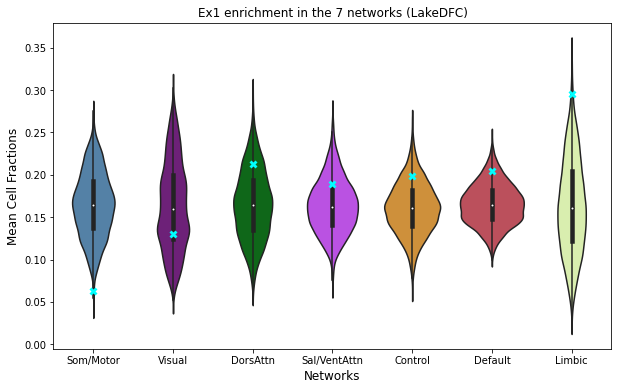

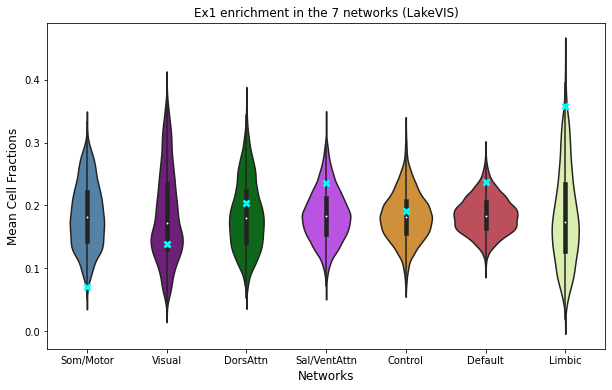

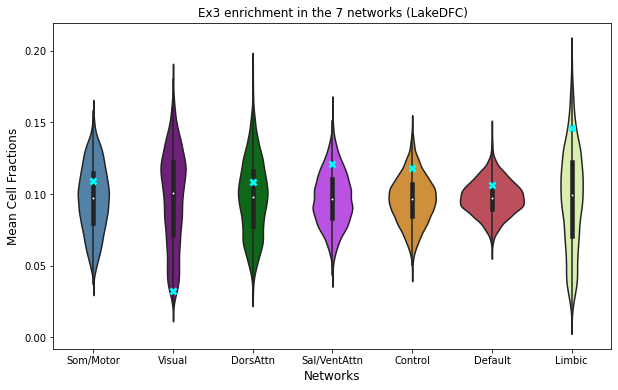

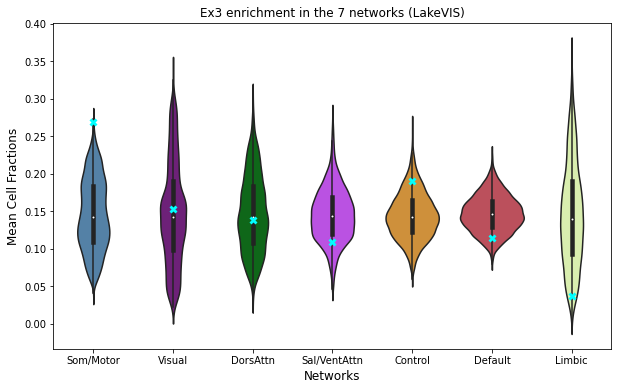

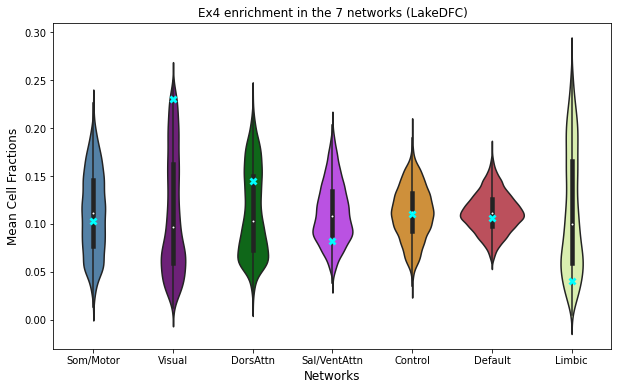

...

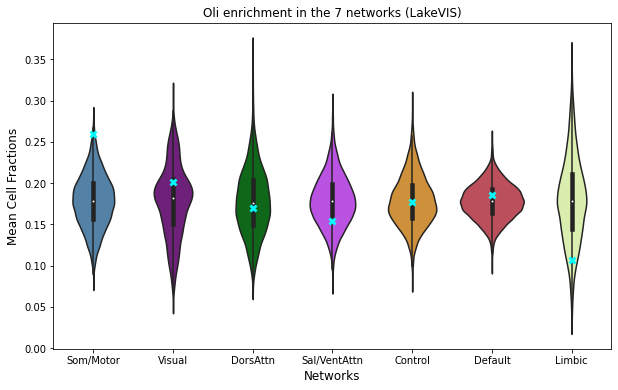

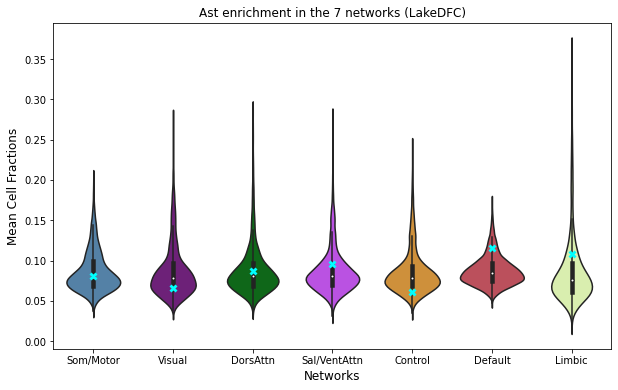

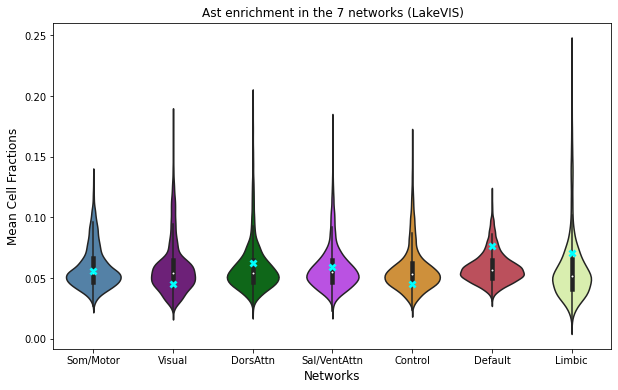

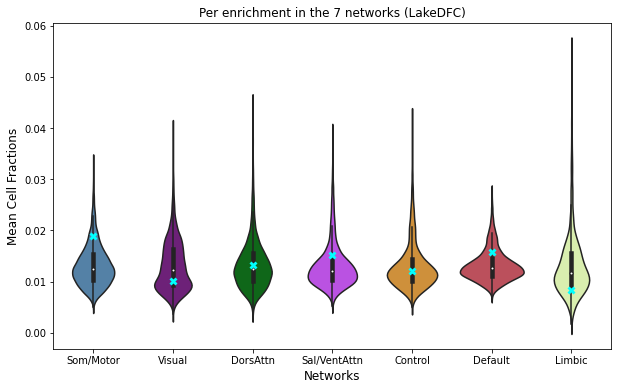

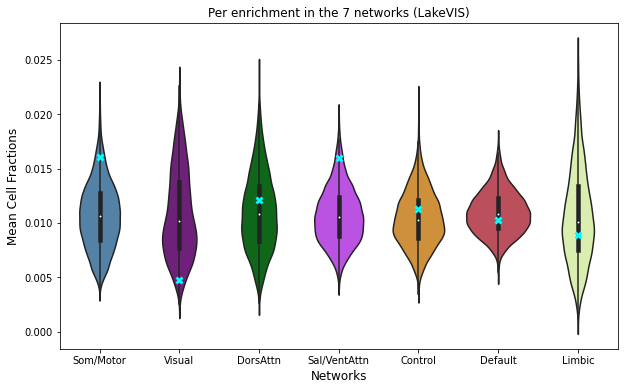

In [11]:
# Create an array with the colors you want to use
yeo_RGB = [(70/255, 130/255, 180/255),
           (120/255, 18/255, 134/255),
           (0/255, 118/255, 14/255),
           (196/255, 58/255, 250/255),
           (230/255, 148/255, 34/255),
           (205/255, 62/255, 78/255),
          (220/255, 248/255, 164/255)]
# Set your custom color palette
sns.set_palette(sns.color_palette(yeo_RGB))

cell_list = ['Ex1','Ex3','Ex4','Ex5','Ex6','Ex8','In1','In3','In4','SST','PVALB','End','OPC','Mic','Oli','Ast','Per']


for this_cell in cell_list:
    DFC = df_DFC.loc[df_DFC['celltype']==this_cell]
    DFC_emp = df_DFC_emp.loc[df_DFC_emp['celltype']==this_cell]
    
    VIS = df_VIS.loc[df_VIS['celltype']==this_cell]  
    VIS_emp = df_VIS_emp.loc[df_VIS_emp['celltype']==this_cell]
    
    plt.figure(figsize=(10,6))
    plt.title(f'{this_cell} enrichment in the 7 networks (LakeDFC)')
    sns.violinplot(x='network', y='fraction', data=DFC)
    sns.swarmplot(x ='network', y ='fraction', data = DFC_emp, color= "cyan", size=8, marker='X')
    plt.xlabel(xlabel='Networks', fontsize=12)
    plt.ylabel(ylabel='Mean Cell Fractions', fontsize=12)
    plt.savefig(figure_dir+'/Violin_LakeDFC_7Net_'+this_cell+'.pdf')
    
    plt.figure(figsize=(10,6))
    plt.title(f'{this_cell} enrichment in the 7 networks (LakeVIS)')
    sns.violinplot(x='network', y='fraction', data=VIS)
    sns.swarmplot(x ='network', y ='fraction', data = VIS_emp, color= "cyan", size=8, marker='X')
    plt.xlabel(xlabel='Networks', fontsize=12)
    plt.ylabel(ylabel='Mean Cell Fractions', fontsize=12)
    plt.savefig(figure_dir+'/Violin_LakeVIS_7Net_'+this_cell+'.pdf')

### 2. Table: p-value for cell-type enrichment

In [16]:
## Step1: prepare the z-scores
# Read in the z-value table
z_VIS = pd.read_csv(net_enrich_dir + '/z_LakeVIS_7Networks.csv',header=0,index_col=0)
z_DFC = pd.read_csv(net_enrich_dir + '/z_LakeDFC_7Networks.csv',header=0,index_col=0)

# remove the 'VIS_' or 'DFC_'
z_VIS = z_VIS.rename(index=lambda s: s.replace('VIS_', ''))
z_DFC = z_DFC.rename(index=lambda s: s.replace('DFC_', ''))

# remove the uncommon cell type
# in DFC, remove Ex2
z_DFC = z_DFC.drop(index=('Ex2'))
# in VIS, remove In2
z_VIS = z_VIS.drop(index=('In2'))


## Step2: calculate averaged gradient1 values for the 7 networs
# load the labels for the Schaefer networks
schaefer400_7Networks = pd.read_csv(gradient_dir+'/schaefer_400_7Net_labels_manually_added.csv',header=None,index_col=0)
network_labels = schaefer400_7Networks.values
network_labels = np.transpose(network_labels)

# load the gradient1 values in Schaefer networks
gradient1_schaefer400 = pd.read_csv(gradient_dir+'/gradient_1_schaefer_400_fsa5.csv',header=None,index_col=None)
gradient1_schaefer400 = gradient1_schaefer400.values

# matrix to store network-level gradient1 value
num_nets = 7
gradient1_7net = np.zeros((1,num_nets))
for net in range(num_nets):
    this_net = net+1
    gradient1_7net[0,net] = np.mean(gradient1_schaefer400[np.where(network_labels==this_net)])
    

## Step3: dot product the mean z-score matrix and gradient1 matrix 
# (sum of cell-fraction weighted by gradient1 in network)

# transpose the gradient1 values (7 by 1 vector)
gradient1_7net = np.transpose(gradient1_7net)

# networks
net_order = list(np.transpose(gradient1_7net)[0].argsort(axis=0))
# To be consistent with existing literature, we ended up using the following order for plots
final_net_order = [1, 0, 2, 3, 5, 6, 4] # following the order of their spatial locaiton in gradient 1

# take the mean of DFC and VIS inferred z-score (17 by 7 matrix)
z_mean = np.mean(np.array([z_DFC.values, z_VIS.values]), axis=0)

# calculate the weighted sum
cell_weight = np.dot(z_mean,gradient1_7net)
cell_weight = np.transpose(cell_weight)[0]


## Step4: get the intended order of the 7 networks and 17 cell types
# cell types
cell_order = list(cell_weight.argsort(axis=0))
#cell_order = list(cell_order.argsort())



In [17]:
z_VIS

,Visual,Som/Motor,DorsAttn,Sal/VentAttn,Limbic,Control,Default
Ex1,-0.644723,-2.178834,0.338905,1.216625,2.292063,0.246185,1.800849
Ex3,0.090949,2.608851,-0.160833,-1.020954,-1.581377,1.488254,-1.347926
Ex4,2.277835,-0.095188,0.889696,-1.468648,-1.166333,-0.702452,-1.079689
Ex5,-1.842069,-0.698559,-0.511177,1.806799,1.575208,1.713008,2.572933
Ex6,-0.105614,1.200797,-2.166484,1.056720,-0.689637,-1.247261,1.333453
Ex8,-1.337259,0.044094,-0.898179,3.675527,1.825074,-0.650163,-0.432548
In1,-1.008417,-1.336925,-1.263752,1.484059,2.392870,0.059457,1.076265
In3,0.432527,1.066149,-0.156197,-1.610767,-0.820510,0.223168,2.235224
In4,-0.368428,2.103613,-1.423664,1.124374,-1.611039,0.282868,0.128369
PVALB,1.632892,1.450847,1.379189,-2.243721,-1.615940,0.346620,-2.040894


In [18]:
z_DFC

,Visual,Som/Motor,DorsAttn,Sal/VentAttn,Limbic,Control,Default
Ex1,-0.645399,-2.648004,1.146414,0.769871,2.341558,1.217152,1.574668
Ex3,-1.946248,0.528067,0.426461,1.262190,1.378160,1.340455,0.735623
Ex4,1.929016,-0.214326,0.721857,-0.950621,-1.135328,-0.059834,-0.284157
Ex5,-0.752486,0.227885,-0.581544,1.380584,-0.389080,0.818357,1.795525
Ex6,-0.357956,1.007302,-1.903502,1.028837,0.258517,-1.703532,1.091653
Ex8,-0.656137,0.026432,-1.036560,3.718739,0.800910,-0.504652,0.009482
In1,-1.168242,-1.196267,-0.975985,0.961138,2.698080,1.395695,0.824395
In3,2.038732,-0.194707,-0.531813,0.106318,-0.133421,-1.328126,-0.254868
In4,0.984618,1.207910,-0.042144,-0.873614,-1.947240,0.228316,0.272362
PVALB,1.164938,2.204704,0.765344,-1.843763,-1.598057,-0.199509,-1.986758


In [20]:
list(np.transpose(gradient1_7net)[0])

[-3.3585369876627005,
 -4.631333655261304,
 -2.1723075586119256,
 -1.8781847066428596,
 3.087347822728093,
 2.8714106446812124,
 4.345116722741732]

In [21]:
cell_order

[9, 11, 14, 2, 8, 12, 7, 1, 4, 5, 13, 16, 10, 3, 15, 6, 0]

In [22]:
list(cell_weight)

[26.45224985958554,
 -2.2463380941688795,
 -13.43664562705815,
 18.596516693883114,
 -1.505955003388327,
 -0.18178872286170833,
 23.734888205498315,
 -2.7642844831066578,
 -11.234827683459448,
 -25.1545829149516,
 18.304010238698318,
 -20.55082602911442,
 -6.924180920866391,
 8.13554960057899,
 -15.796670493972469,
 19.4113773814297,
 10.211537130016293]

#### reorder the z/p-value table

In [25]:
# Read in the z-value table
z_VIS = pd.read_csv(net_enrich_dir + '/z_LakeVIS_7Networks.csv',header=0,index_col=0)
z_DFC = pd.read_csv(net_enrich_dir + '/z_LakeDFC_7Networks.csv',header=0,index_col=0)

# remove the 'VIS_' or 'DFC_'
z_VIS = z_VIS.rename(index=lambda s: s.replace('VIS_', ''))
z_DFC = z_DFC.rename(index=lambda s: s.replace('DFC_', ''))

# add 'VIS_' or 'DFC_' to column
z_VIS = z_VIS.rename(columns=lambda s: s+'_VIS')
z_DFC = z_DFC.rename(columns=lambda s: s+'_DFC')

# remove the uncommon cell type
# in DFC, remove Ex2
z_DFC = z_DFC.drop(index=('Ex2'))
# in VIS, remove In2
z_VIS = z_VIS.drop(index=('In2'))

# reorder the (column) network order
z_DFC = z_DFC.iloc[:, final_net_order]
z_VIS = z_VIS.iloc[:, final_net_order]

# reorder the (row) cell type order
z_DFC = z_DFC.iloc[cell_order, :]
z_VIS = z_VIS.iloc[cell_order, :]


# load the p-value table
p_VIS = pd.read_csv(net_enrich_dir + '/p_LakeVIS_7Networks.csv',header=0,index_col=0)
p_DFC = pd.read_csv(net_enrich_dir + '/p_LakeDFC_7Networks.csv',header=0,index_col=0)

# remove the 'VIS_' or 'DFC_'
p_VIS = p_VIS.rename(index=lambda s: s.replace('VIS_', ''))
p_DFC = p_DFC.rename(index=lambda s: s.replace('DFC_', ''))

# add 'VIS_' or 'DFC_' to column
p_VIS = p_VIS.rename(columns=lambda s: s+'_VIS')
p_DFC = p_DFC.rename(columns=lambda s: s+'_DFC')

# remove the uncommon cell type
# in DFC, remove Ex2
p_DFC = p_DFC.drop(index=('Ex2'))
# in VIS, remove In2
p_VIS = p_VIS.drop(index=('In2'))

# reorder the (column) network order
p_DFC = p_DFC.iloc[:, final_net_order]
p_VIS = p_VIS.iloc[:, final_net_order]


# reorder the (row) cell type order
p_DFC = p_DFC.iloc[cell_order, :]
p_VIS = p_VIS.iloc[cell_order, :]

# combine the two table
p_both = pd.concat([p_DFC.iloc[:,0],p_VIS.iloc[:,0],
                   p_DFC.iloc[:,1],p_VIS.iloc[:,1],
                   p_DFC.iloc[:,2],p_VIS.iloc[:,2],
                   p_DFC.iloc[:,3],p_VIS.iloc[:,3],
                   p_DFC.iloc[:,4],p_VIS.iloc[:,4],
                   p_DFC.iloc[:,5],p_VIS.iloc[:,5],
                   p_DFC.iloc[:,6],p_VIS.iloc[:,6]], axis=1)
p_both.to_csv(net_enrich_dir + '/p_LakeDFC_VIS_7Networks.csv',header=True,index=True)

z_both = pd.concat([z_DFC.iloc[:,0],z_VIS.iloc[:,0],
                   z_DFC.iloc[:,1],z_VIS.iloc[:,1],
                   z_DFC.iloc[:,2],z_VIS.iloc[:,2],
                   z_DFC.iloc[:,3],z_VIS.iloc[:,3],
                   z_DFC.iloc[:,4],z_VIS.iloc[:,4],
                   z_DFC.iloc[:,5],z_VIS.iloc[:,5],
                   z_DFC.iloc[:,6],z_VIS.iloc[:,6]], axis=1)
z_both.to_csv(net_enrich_dir + '/z_LakeDFC_VIS_7Networks.csv',header=True,index=True)


In [26]:
z_max = z_both.max().max()
print(f'Max is {z_max}')

z_min = z_both.min().min()
print(f'Min is {z_min}')

Max is 3.7187394317069655
Min is -2.6480044030806518


In [27]:
p_both

,Som/Motor_DFC,Som/Motor_VIS,Visual_DFC,Visual_VIS,DorsAttn_DFC,DorsAttn_VIS,Sal/VentAttn_DFC,Sal/VentAttn_VIS,Control_DFC,Control_VIS,Default_DFC,Default_VIS,Limbic_DFC,Limbic_VIS
PVALB,0.027475,0.146822,0.244044,0.102492,0.444067,0.167837,0.065218,0.024850,0.841864,0.728877,0.046949,0.041261,0.110030,0.106107
End,0.283862,0.063036,0.004979,0.167124,0.757109,0.877384,0.103961,0.468425,0.216773,0.173695,0.478877,0.594289,0.120786,0.142245
Oli,0.004895,0.012802,0.582929,0.594496,0.652631,0.857362,0.418235,0.427350,0.697503,0.966206,0.871319,0.732853,0.156555,0.158315
Ex4,0.830293,0.924165,0.053729,0.022736,0.470382,0.373629,0.341797,0.141928,0.952288,0.482398,0.776290,0.280281,0.256238,0.243480
In4,0.227082,0.035412,0.324812,0.712554,0.966384,0.154544,0.382328,0.260855,0.819401,0.777278,0.785343,0.897857,0.051506,0.107171
Per,0.157009,0.079459,0.532591,0.134697,0.968154,0.759070,0.630178,0.040880,0.823649,0.728499,0.394723,0.746090,0.449171,0.678812
In3,0.845622,0.286356,0.041477,0.665359,0.594856,0.875877,0.915330,0.107231,0.184137,0.823405,0.798825,0.025403,0.893861,0.411925
Ex3,0.597453,0.009085,0.051625,0.927533,0.669772,0.872225,0.206881,0.307276,0.180097,0.136684,0.461960,0.177682,0.168154,0.113792
Ex6,0.313790,0.229830,0.720376,0.915888,0.056975,0.030274,0.303556,0.290640,0.088468,0.212302,0.274986,0.182383,0.796008,0.490422
Ex8,0.978913,0.964830,0.511736,0.181138,0.299941,0.369090,0.000200,0.000237,0.613803,0.515587,0.992434,0.665343,0.423184,0.067990


#### 1. FDR correct

In [29]:
q_both = p_both.copy()

q_both['Som/Motor_DFC'] = np.where(q_both[['Som/Motor_DFC']] > 0.5, 1-q_both[['Som/Motor_DFC']], q_both[['Som/Motor_DFC']])
q_both['Som/Motor_VIS'] = np.where(q_both[['Som/Motor_VIS']] > 0.5, 1-q_both[['Som/Motor_VIS']], q_both[['Som/Motor_VIS']])
q_both['Visual_DFC'] = np.where(q_both[['Visual_DFC']] > 0.5, 1-q_both[['Visual_DFC']], q_both[['Visual_DFC']])
q_both['Visual_VIS'] = np.where(q_both[['Visual_VIS']] > 0.5, 1-q_both[['Visual_VIS']], q_both[['Visual_VIS']])
q_both['DorsAttn_DFC'] = np.where(q_both[['DorsAttn_DFC']] > 0.5, 1-q_both[['DorsAttn_DFC']], q_both[['DorsAttn_DFC']])
q_both['DorsAttn_VIS'] = np.where(q_both[['DorsAttn_VIS']] > 0.5, 1-q_both[['DorsAttn_VIS']], q_both[['DorsAttn_VIS']])
q_both['Sal/VentAttn_DFC'] = np.where(q_both[['Sal/VentAttn_DFC']] > 0.5, 1-q_both[['Sal/VentAttn_DFC']], q_both[['Sal/VentAttn_DFC']])
q_both['Sal/VentAttn_VIS'] = np.where(q_both[['Sal/VentAttn_VIS']] > 0.5, 1-q_both[['Sal/VentAttn_VIS']], q_both[['Sal/VentAttn_VIS']])
q_both['Control_DFC'] = np.where(q_both[['Control_DFC']] > 0.5, 1-q_both[['Control_DFC']], q_both[['Control_DFC']])
q_both['Control_VIS'] = np.where(q_both[['Control_VIS']] > 0.5, 1-q_both[['Control_VIS']], q_both[['Control_VIS']])
q_both['Default_DFC'] = np.where(q_both[['Default_DFC']] > 0.5, 1-q_both[['Default_DFC']], q_both[['Default_DFC']])
q_both['Default_VIS'] = np.where(q_both[['Default_VIS']] > 0.5, 1-q_both[['Default_VIS']], q_both[['Default_VIS']])
q_both['Limbic_DFC'] = np.where(q_both[['Limbic_DFC']] > 0.5, 1-q_both[['Limbic_DFC']], q_both[['Limbic_DFC']])
q_both['Limbic_VIS'] = np.where(q_both[['Limbic_VIS']] > 0.5, 1-q_both[['Limbic_VIS']], q_both[['Limbic_VIS']])

both_LakeDFC_p = np.concatenate((q_both[['Som/Motor_DFC']].values.ravel(), 
                                 q_both[['Visual_DFC']].values.ravel(), 
                                 q_both[['DorsAttn_DFC']].values.ravel(), 
                                 q_both[['Sal/VentAttn_DFC']].values.ravel(), 
                                 q_both[['Control_DFC']].values.ravel(), 
                                 q_both[['Default_DFC']].values.ravel(), 
                                 q_both[['Limbic_DFC']].values.ravel()),axis=0)
both_LakeDFC_p = fdr(both_LakeDFC_p, alpha=0.05, method='fdr_bh', is_sorted=False)[1]
q_both[['Som/Motor_DFC']] = both_LakeDFC_p[:17].reshape(17, 1)
q_both[['Visual_DFC']] = both_LakeDFC_p[17:17*2].reshape(17, 1)
q_both[['DorsAttn_DFC']] = both_LakeDFC_p[17*2:17*3].reshape(17, 1)
q_both[['Sal/VentAttn_DFC']] = both_LakeDFC_p[17*3:17*4].reshape(17, 1)
q_both[['Control_DFC']] = both_LakeDFC_p[17*4:17*5].reshape(17, 1)
q_both[['Default_DFC']] = both_LakeDFC_p[17*5:17*6].reshape(17, 1)
q_both[['Limbic_DFC']] = both_LakeDFC_p[17*6:17*7].reshape(17, 1)

both_LakeVIS_p = np.concatenate((q_both[['Som/Motor_VIS']].values.ravel(), 
                                 q_both[['Visual_VIS']].values.ravel(), 
                                 q_both[['DorsAttn_VIS']].values.ravel(), 
                                 q_both[['Sal/VentAttn_VIS']].values.ravel(), 
                                 q_both[['Control_VIS']].values.ravel(), 
                                 q_both[['Default_VIS']].values.ravel(), 
                                 q_both[['Limbic_VIS']].values.ravel()),axis=0)
both_LakeVIS_p = fdr(both_LakeVIS_p, alpha=0.05, method='fdr_bh', is_sorted=False)[1]
q_both[['Som/Motor_VIS']] = both_LakeVIS_p[:17].reshape(17, 1)
q_both[['Visual_VIS']] = both_LakeVIS_p[17:17*2].reshape(17, 1)
q_both[['DorsAttn_VIS']] = both_LakeVIS_p[17*2:17*3].reshape(17, 1)
q_both[['Sal/VentAttn_VIS']] = both_LakeVIS_p[17*3:17*4].reshape(17, 1)
q_both[['Control_VIS']] = both_LakeVIS_p[17*4:17*5].reshape(17, 1)
q_both[['Default_VIS']] = both_LakeVIS_p[17*5:17*6].reshape(17, 1)
q_both[['Limbic_VIS']] = both_LakeVIS_p[17*6:17*7].reshape(17, 1)

q_both

,Som/Motor_DFC,Som/Motor_VIS,Visual_DFC,Visual_VIS,DorsAttn_DFC,DorsAttn_VIS,Sal/VentAttn_DFC,Sal/VentAttn_VIS,Control_DFC,Control_VIS,Default_DFC,Default_VIS,Limbic_DFC,Limbic_VIS
PVALB,0.272459,0.311998,0.427077,0.308617,0.488721,0.323934,0.323371,0.256457,0.413294,0.375681,0.290624,0.256457,0.413294,0.308617
End,0.462735,0.287452,0.120441,0.323934,0.427077,0.308617,0.413294,0.492122,0.427077,0.323934,0.493779,0.445628,0.413294,0.308617
Oli,0.120441,0.256457,0.488721,0.445628,0.475136,0.308617,0.488721,0.458150,0.463118,0.256457,0.413294,0.375681,0.413294,0.323934
Ex4,0.413294,0.291108,0.290624,0.256457,0.492867,0.427518,0.472951,0.308617,0.290624,0.492122,0.427077,0.377600,0.435604,0.366761
In4,0.427077,0.256457,0.471559,0.377600,0.285734,0.322644,0.488721,0.375681,0.413294,0.350340,0.427077,0.308617,0.290624,0.308617
Per,0.413294,0.295488,0.492867,0.308617,0.285734,0.366761,0.488721,0.256457,0.413294,0.375681,0.488721,0.375681,0.488721,0.394035
In3,0.413294,0.377600,0.290624,0.398242,0.488721,0.308617,0.387527,0.308617,0.413439,0.323934,0.427077,0.256457,0.413294,0.445628
Ex3,0.488721,0.256457,0.290624,0.287452,0.471559,0.308617,0.427077,0.388305,0.413294,0.308617,0.492867,0.323934,0.413294,0.308617
Ex6,0.471559,0.355192,0.462156,0.303312,0.294784,0.256457,0.463118,0.377600,0.389917,0.346081,0.460891,0.323934,0.427077,0.492122
Ex8,0.250939,0.256457,0.496039,0.323934,0.463118,0.426425,0.022966,0.028246,0.488721,0.492122,0.120441,0.398242,0.488721,0.287452


#### Plot z/p-value table

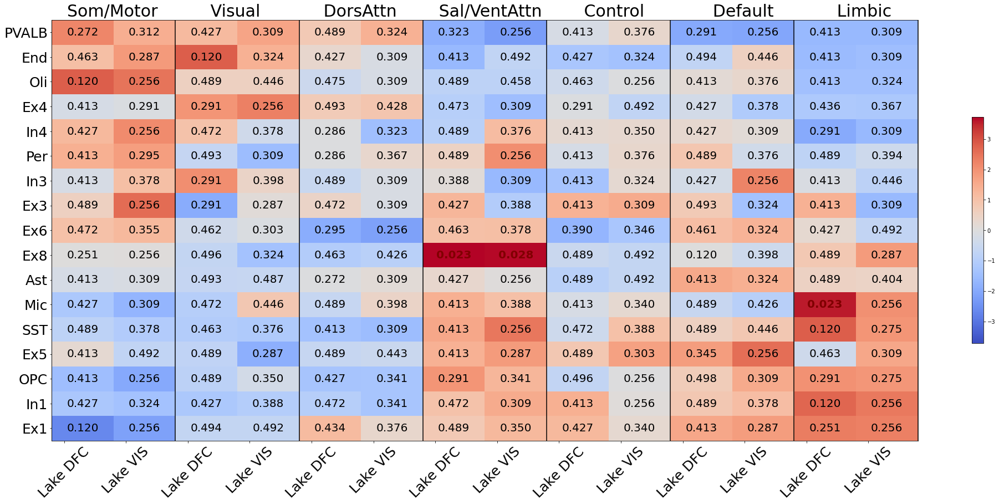

In [33]:
x_labels = ['Lake DFC','Lake VIS','Lake DFC','Lake VIS','Lake DFC','Lake VIS',
            'Lake DFC','Lake VIS','Lake DFC','Lake VIS','Lake DFC','Lake VIS',
            'Lake DFC','Lake VIS']
y_labels = list(z_both.index.values)
# order in the heatmap is reversed from dataframe
y_labels.reverse()

f, ax = plt.subplots(figsize = (35,15))
im=ax.imshow(z_both,cmap='coolwarm',extent=[0, 35, 0, 17],vmin=-z_max,vmax=z_max)
ax.set_xticks(np.arange(0.5,35.5,2.5))
ax.set_xticklabels(x_labels, rotation=45,fontsize=25)
ax.set_yticks(np.arange(0.5,17.5,1))
ax.set_yticklabels(y_labels, fontsize=25)
ax.set_title('Som/Motor          Visual            DorsAttn        '+
             'Sal/VentAttn        Control             Default            Limbic  ', fontsize=30)

# add vertical lines to separate 7 networks
x = np.array([0,5,10,15,20,25,30,35])
ax.vlines(x,0,17,'black')

# add p-value
p_columns = list(p_both.columns.values)
for y in range(17):
    ii=0
    for x in np.arange(0,35,2.5):
        
        this_p = p_columns[ii]
        this_q = q_both[this_p][y_labels[y]]
        this_p = p_both[this_p][y_labels[y]]
        if (this_p < 0.05) & (this_q < 0.05):
            if this_q < 0.001:
                plt.text(x + 1.25, y + 0.5, '<0.001',
                         horizontalalignment='center',
                         verticalalignment='center',
                         fontsize=20,
                         weight="bold",
                         color='maroon'
                        )
            else:
                plt.text(x + 1.25, y + 0.5, '%.3f' % this_q,
                         horizontalalignment='center',
                         verticalalignment='center',
                         fontsize=20,
                         weight="bold",
                         color='maroon'
                        )
                
        elif this_p > 0.5:
            this_p = 1-this_p
            if (this_p < 0.05) & (this_q < 0.05):
                if this_q < 0.001:
                    plt.text(x + 1.25, y + 0.5, '<0.001',
                             horizontalalignment='center',
                             verticalalignment='center',
                             fontsize=20,
                             weight="bold",
                             color='navy'
                            )
                else:
                    plt.text(x + 1.25, y + 0.5, '%.3f' % this_q,
                             horizontalalignment='center',
                             verticalalignment='center',
                             fontsize=20,
                             weight="bold",
                             color='navy'
                             )
            else:
                plt.text(x + 1.25, y + 0.5, '%.3f' % this_q,
                         horizontalalignment='center',
                         verticalalignment='center',
                         fontsize=20
                         )
        else:
            plt.text(x + 1.25, y + 0.5, '%.3f' % this_q,
                     horizontalalignment='center',
                     verticalalignment='center',
                     fontsize=20
                     )
        
        ii+=1
f.colorbar(im, ax=ax,shrink=.5)
plt.savefig(figure_dir+f'/Table_Network_CellType_Enrich_Spintest_fdr.pdf')

### 3. Radar chart: cell-type enrichment fingerprint for each network
#### calculate the percent enrichment

In [16]:
network_names = ['Som/Motor','Visual','DorsAttn','Sal/VentAttn','Control','Limbic','Default']
yeo_RGB = ['rgb(70, 130, 180)','rgb(120, 18, 134)','rgb(0, 118, 14)',
           'rgb(196, 58, 250)','rgb(230, 148, 34)','rgb(220, 248, 164)',
           'rgb(205, 62, 78)']

In [17]:
# Read in the z-value table
#z_VIS = pd.read_csv(net_enrich_dir + '/z_LakeVIS_7Networks.csv',header=0,index_col=0)
#z_DFC = pd.read_csv(net_enrich_dir + '/z_LakeDFC_7Networks.csv',header=0,index_col=0)

# Step1: replace index name (e.g. "VIS_Ex1" -> "Ex1")
#p_DFC_VIS_schaefer400 = pd.read_csv(net_enrich_dir+'/p_LakeDFC_LakeVIS_7Networks.csv',header=0,index_col=0)
# get the order of index
#new_rows = list(p_DFC_VIS_schaefer400.index.values)

# Step2: reorder the columns
# specify the order of networks
#new_nets = ['Visual','Som/Motor','DorsAttn','Sal/VentAttn','Control','Limbic','Default']
# reorder columns accordingly
#radar_VIS = z_VIS[new_nets]
#radar_DFC = z_DFC[new_nets]

# Step3: subset rows by index names
# remove the 'VIS_' or 'DFC_'
#radar_VIS = radar_VIS.rename(index=lambda s: s.replace('VIS_', ''))
#radar_DFC = radar_DFC.rename(index=lambda s: s.replace('DFC_', ''))
radar_VIS = z_VIS.rename(columns=lambda s: s.replace('_VIS', ''))
radar_DFC = z_DFC.rename(columns=lambda s: s.replace('_DFC', ''))
# subset and reorder the rows
#radar_VIS = radar_VIS.loc[new_rows]
#radar_DFC = radar_DFC.loc[new_rows]

In [18]:
def get_theta(pct, num_points):
    start = pct[0] * 360
    length = (pct[1] - pct[0]) * 360
    step = 360 / num_points
    return np.arange(start, start + length + step, step)

In [19]:
df=radar_VIS
df_2=radar_DFC

# set the max and min for the table
df_ceil = np.ceil(df.max().max())
df_floor = np.floor(df.min().min())

for this_net in range(len(network_names)):
    
    # corresponding color
    color = yeo_RGB[this_net]
    
    fig = go.Figure()
    
    # pull out the celltype z-score for this network
    r = list(df[network_names[this_net]].values)
    theta = list(df.index.values)
    fig.add_trace(go.Scatterpolar(
        r=r,
        theta=theta,
        fill='toself',
        name=network_names[this_net],
        line_color=color
    ))
    
    r_2 = list(df_2[network_names[this_net]].values)
    theta_2 = list(df_2.index.values)
    fig.add_trace(go.Scatterpolar(
        r=r_2,
        theta=theta_2,
        fill='toself',
        name=network_names[this_net],
        line_color=color
    ))
    
    # reference circle
    r_ref = list(np.zeros(17))
    theta_ref = list(df_2.index.values)
    fig.add_trace(go.Scatterpolar(
        r=r_ref,
        theta=theta_ref,
        name='reference',
        mode='markers',
        marker = dict(
        color = "black",
        symbol = "x",
        size = 5
        )
    ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[df_floor, df_ceil]
            )),
        showlegend=False
    )

    fig.show()
    net_name = network_names[this_net].replace("/", "_")
    fig.write_image(figure_dir+'/Radar_7Net_'+net_name+'.pdf')

In [10]:
df=radar_VIS

# set the max and min for the table
df_ceil = np.ceil(df.max().max())
df_floor = np.floor(df.min().min())

for this_net in range(len(network_names)):
    # pull out the celltype z-score for this network
    r = list(df[network_names[this_net]].values)
    theta = list(df.index.values)
    # corresponding color
    color = yeo_RGB[this_net]
    
    fig = go.Figure()

    fig.add_trace(go.Scatterpolar(
        r=r,
        theta=theta,
        fill='toself',
        name=network_names[this_net],
        line_color=yeo_RGB[this_net]
    ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[df_floor, df_ceil]
            )),
        showlegend=False
    )

    fig.show()
    net_name = network_names[this_net].replace("/", "_")
    fig.write_image(figure_dir+'/Radar_LakeVIS_7Net_'+net_name+'.png')


In [11]:
df=radar_DFC

# set the max and min for the table
df_ceil = np.ceil(df.max().max())
df_floor = np.floor(df.min().min())

for this_net in range(len(network_names)):
    # pull out the celltype z-score for this network
    r = list(df[network_names[this_net]].values)
    theta = list(df.index.values)
    # corresponding color
    color = yeo_RGB[this_net]
    
    fig = go.Figure()

    fig.add_trace(go.Scatterpolar(
        r=r,
        theta=theta,
        fill='toself',
        name=network_names[this_net],
        line_color=yeo_RGB[this_net]
    ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[df_floor, df_ceil]
            )),
        showlegend=False
    )

    fig.show()
    net_name = network_names[this_net].replace("/", "_")
    fig.write_image(figure_dir+'/Radar_LakeDFC_7Net_'+net_name+'.png')
    